

###a) 2D homography

###b) Image warping

###c) RANSAC using SIFT keypoints

###d) Image stitching

# Environment setup

In [ ]:
# Mount your Google Drive to this notebook
# The purpose is to allow your code to access to your files
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Change the directory to your own working directory
# Any files under your working directory are available to your code
# TO DO: enter the name of your directory
import os
os.chdir('/content/drive/MyDrive/CV/data')


In [ ]:
# The following is needed to allow the use of SIFT 
# (need OpenCV version 4.5 or later)
# For a new installation, you may see a message:
#  "You must restart the runtime in order to use newly installed versions." 
#  One way to do this is to click "Runtime" -> "Restart Runtime"
# If you see an error message, you may need to run this step again, after running the "Import" block that follows
!pip install opencv-python==4.5.3.*

     |████████████████████████████████| 49.9 MB 94 kB/s 
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
# Import library modules
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
# PIL is the Python Imaging Library
from PIL import Image  
# The following is a substitute for cv2.imshow, which Colab does not allow
from google.colab.patches import cv2_imshow

print('Python version:', sys.version)
print('OpenCV version:', cv2.__version__)
print('NumPy version: ', np.__version__)


Python version: 3.7.12 (default, Sep 10 2021, 00:21:48) 
[GCC 7.5.0]
OpenCV version: 4.5.3
NumPy version:  1.19.5


#Getting started

The following functions are helpful for loading images into floating-point format, and for displaying images that are in that format.  We use those functions to visualize 3 separate images that we want to stitch together. Notice that you can adjust the size of the figure that is displayed.


In [ ]:

def load_image(filename):
  img = np.asarray(Image.open(filename))
  img = img.astype("float32")/255.0
  return img

def show_image(img):
  fig = plt.figure()
  fig.set_size_inches(18, 10) # You can adjust the size of the displayed figure
  plt.imshow(img)

left_img = cv2.imread("Newman1.png")
center_img = load_image("Newman2.png")
right_img = load_image("Newman3.png")
#show_image(np.concatenate([left_img, center_img, right_img], axis=1))
cv2_imshow(left_img)
cv2_imshow(center_img)
cv2_imshow(right_img)


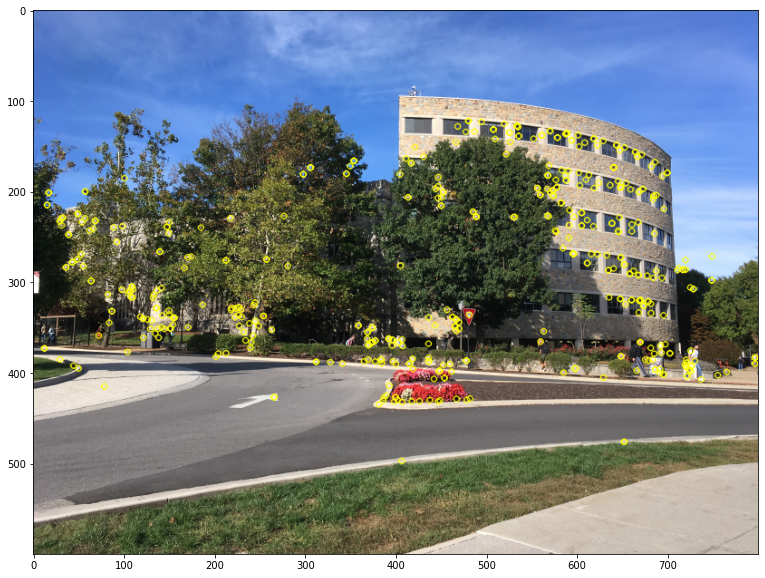

In [ ]:
def testSIFT(img1):
  sift = cv2.SIFT_create(nfeatures=500)
  kp = sift.detect(img1, None)
  img1=cv2.drawKeypoints(img1, kp, None, color=(0, 255, 255))
  
  fig = plt.figure()
  fig.set_size_inches(18,10) # You can adjust the size of the displayed figure
  plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))


img = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)
testSIFT(img)

#Part (a):  2D homography

We implement the 2 functions that are shown in the next code block. (OpenCV has a findHomography() function, and other related functions, but for this section we write our own version.)

1.   **compute_homography(src, dst)** receives two matrices, each of size Nx2. Each matrix contains N two-dimensional points. For each value of i, src[i] and dst[i] are corresponding points from two different images. The function should return the homography matrix H of size 3x3 that maps every point from the source (src) to the destination (dst). 

2.   **apply_homography(src, H)** receives points in matrix src (an Nx2 matrix), and a homography transformation H (a 3x3 matrix). This function should use the homography matrix to transform each point in src to a new destination point. Store the resulting points in matrix dst, which is the same size as src. The function should return dst. 



In [ ]:
def compute_homography(src, dst):
  '''Computes the homography from src to dst.
   Input:
    src: source points, shape (N, 2), where N >= 4
    dst: destination points, shape (N, 2)
   Output:
    H: homography from source points to destination points, shape (3, 3)

  '''
  H = np.matrix('1, 0, 0; 0, 1, 0; 0, 0, 1')


  #construct the Ax = 0 form where x is the flat homograpghy matrix
  n = np.shape(src)[0]

  A = np.zeros((2*n, 9))
  for i in range(n):
    A[2*i] =   np.array([src[i, 0], src[i, 1], 1,      0,          0,      0,  -dst[i, 0]*src[i, 0],    -dst[i, 0]*src[i, 1],    -dst[i, 0] ])
    A[2*i+1] = np.array([0,             0,        0,  src[i, 0],  src[i, 1],  1,  -dst[i, 1]*src[i, 0],    -dst[i, 1]*src[i, 1],    -dst[i, 1] ])

  # now V vector corresponding to smallest eigen value for ATA is last vector in the svd
  _,h = np.linalg.eigh(A.T@A)
  h = h[:, 0]
  H = np.reshape(h, (3,3))
  H=H/H[2,2]  #H(2,2)=1

  return H


def apply_homography(src, H):
  '''Applies a homography H to the source points.
   Input:
      src: source points, shape (N, 2)
      H: homography from source points to destination points, shape (3, 3)
   Output:
     dst: destination points, shape (N, 2)

   TO DO: Implement the apply_homography function
  '''
  n = np.shape(src)[0]
  src = np.array(src).T #2xN array
  row_add = np.ones((1, n))
  src = np.concatenate((src, row_add), axis = 0) #3xN array
  src = np.matrix(src)
  #print("The H shape is: ", np.shape(H))
  #print("The src shape is: ", np.shape(src))
  dst = H*src # gives out 3xN result
  dst=dst/dst[2] #scale down
  dst = (dst[0:2]).T # final Nx2 result
  return dst

#Part (b):  Image warping using a 2D homography

We implement the following function so that it performs image warping from a source image (src_img) to a newly created destination image (dst_img).The homography H that is provided indicates a desired mapping from src_img to dst_img. 

In [ ]:
def warp_img(src_img, H, dst_img_size):
  '''Warping of a source image using a homography.
   Input:
      src_img: source image with shape (m, n, 3)
      H: homography, with shape (3, 3), from source image to destination image
      dst_img_size: height and width of destination image; shape (2,)
   Output:
      dst_img: destination image; height and width specified by dst_img_size parameter

  '''
  dst_img = np.zeros([dst_img_size[0], dst_img_size[1], 3])
  m = np.shape(src_img)[0]
  n = np.shape(src_img)[1]
  h_inv = np.linalg.inv(H)
  #print("m=", m, "n=", n)
  for i in range(dst_img_size[0]):
    for j in range(dst_img_size[1]):
      loc = np.matrix((float(j), float(i), 1.0)).T

      dst = h_inv*loc # gives out 3xN result
      dst=dst/dst[2] #scale down
      dst = (dst[0:2]).T # final Nx2 result
      #print(dst)
      x = dst[0, 1]
      #print(x)
      y = dst[0, 0]
      if x < m and x >= 0 and y < n and y >= 0:
        #print(y,x)
        dst_img[i,j, :] = src_img[int(x), int(y), :]

  return dst_img



We use the functions below to help debug implementation. If our code is correct, the output here should show a  mandrill image that has been warped to overlay the blue side of a Rubik's cube.

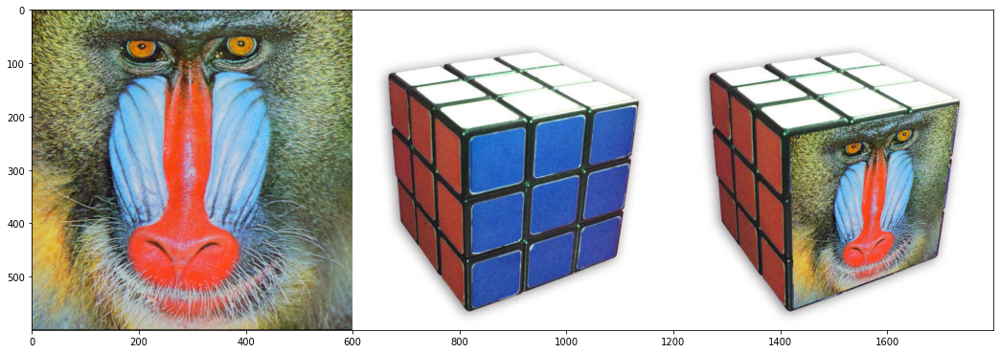

In [ ]:
def binary_mask(img):
  '''Create a binary mask of the image content.
   Input:
    img: source image, shape (m, n, 3)
   Output:
    mask: image of shape (m, n) and type 'int'. For pixel [i, j] of mask, 
      if pixel [i, j] in img is nonzero in any channel, assign 1 to mask[i, j]. 
      Else, assign 0 to mask[i, j].
  '''
  mask = (img[:, :, 0] > 0) | (img[:, :, 1] > 0) | (img[:, :, 2] > 0)
  mask = mask.astype("int")
  return mask

def test_warp():
  src_img = load_image('mandrill.tif')
  canvas_img = load_image('Rubiks_cube.jpg')

  # The following are corners of the mandrill image
  src_pts = np.matrix('0, 0; 0, 511; 511, 511; 511, 0')
  # The following are corners of the blue face of the Rubik's cube
  canvas_pts = np.matrix('218, 238; 225, 560; 490, 463; 530, 178')

  # The following was used during debugging
  # print(canvas_pts)
  # test_x=218
  # test_y=238
  # cv2.circle(canvas_img, (218, 238), 4, (255, 0, 0), thickness=10)

  H = compute_homography(src_pts, canvas_pts)
  dst_img = warp_img(src_img, H, [canvas_img.shape[0], canvas_img.shape[1]])
  #show_image(dst_img)
  dst_mask = 1 - binary_mask(dst_img)
  dst_mask = np.stack((dst_mask,) * 3, -1)
  out_img = np.multiply(canvas_img, dst_mask) + dst_img
  
  dsize = (600, 600) # width and height of canvas_im
  src_smaller = cv2.resize(src_img, dsize, interpolation=cv2.INTER_AREA)
  
  warped_img = np.concatenate((src_smaller, canvas_img, out_img), axis=1)
  show_image(np.clip(warped_img, 0, 1))

test_warp()

#Part (c) RANSAC using SIFT keypoints

We have already confirmed that you can detect SIFT-based keypoints. Next, we can use a matching technique from OpenCV that tries to detect corresponding keypoints between 2 images.

By the way, cv2.BFmatcher() is OpenCV's "brute force" matcher. More description is given in 
https://github.com/abidrahmank/OpenCV2-Python-Tutorials/blob/master/source/py_tutorials/py_feature2d/py_matcher/py_matcher.rst

250


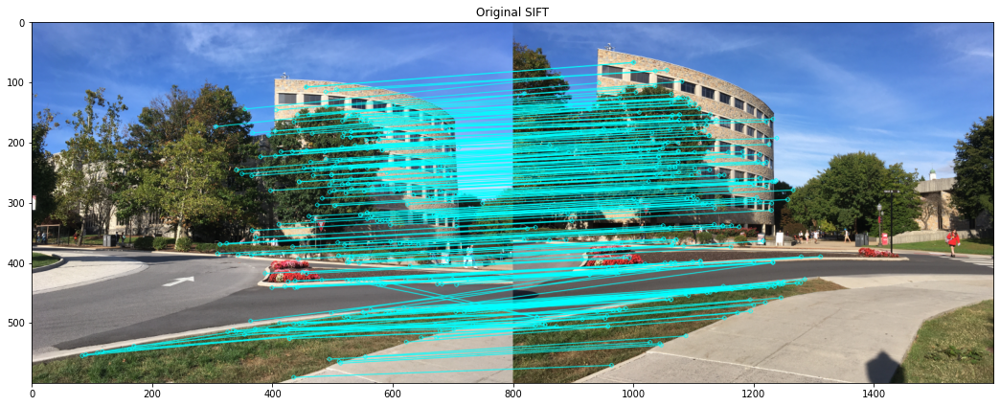

In [ ]:
def genSIFTMatchPairs(img1, img2):
  sift = cv2.SIFT_create()
  #kp = sift.detect(img1, None)
  #kp = cv2.SIFT(edgeThreshold=10)
  kp1, des1 = sift.detectAndCompute(img1, None)
  kp2, des2 = sift.detectAndCompute(img2, None)
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
  matches = bf.match(des1, des2)
  matches = sorted(matches, key = lambda x:x.distance)

  pts1 = np.zeros((250, 2))
  pts2 = np.zeros((250, 2))
  for i in range(250):
    pts1[i,:] = kp1[matches[i].queryIdx].pt
    pts2[i,:] = kp2[matches[i].trainIdx].pt

  return pts1, pts2, matches[:250], kp1, kp2

def test_matches():
  img1 = cv2.imread('Newman1.png')
  img2 = cv2.imread('Newman3.png')
  pts1, pts2, matches1to2, kp1, kp2 = genSIFTMatchPairs(img1, img2)

  # In the following, parameter flags=2 will remove unmatched points from the display
  matching_result = cv2.drawMatches(img1, kp1, img2, kp2, matches1to2, None, flags=2,
    matchColor = (255, 255, 0), singlePointColor=(0, 0, 255))
  
  fig = plt.figure()
  plt.title('Original SIFT')
  fig.set_size_inches(18,10) # You can adjust the size of the displayed figure
  plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))
  print(len(pts1))

test_matches()

Notice that some of the matches from the previous step are not correct. It is possible that those false matches could act as outliers in your homography estimation. In that case we would expect a poor result in any composite image that we create. 

The RANSAC algorithm is a popular way to deal with outliers during model fitting. 

In [ ]:
def RANSAC(Xs, Xd, max_iter, eps):
  '''Find correspondences between two sets of points using the RANSAC algorithm.
   Input:
    Xs: the first set of points (source), shape [n, 2]
    Xd: the second set of points (destination) matched to the first set, shape [n, 2] 
    max_iter: max number of iterations that RANSAC should perform
    eps: tolerance of RANSAC
   Output:
    inliers_id: the indices of matched pairs when using the homography given by RANSAC
    H: the computed homography, shape [3, 3]

  '''
  H = np.zeros([3,3])
  pastcount = 0
  n = np.shape(Xs)[0]
  final_inliers = []
  for k in range(max_iter):
    inliers_id = []
    s = np.random.randint(0, n, size = 4)
    H = compute_homography(Xs[s], Xd[s])
    dst = apply_homography(Xs, H)
    l2 = np.linalg.norm(dst - Xd, axis = 1)
    #if k%10 == 0: print(l2 )
    inliers_id = np.where(l2 < eps)
    if len(inliers_id[0]) > pastcount:
      pastcount =  len(inliers_id[0])
      final_inliers = inliers_id[0]
  print(len(final_inliers))
  H = compute_homography(Xs[final_inliers], Xd[final_inliers])
  dst = apply_homography(Xs, H)
  l2 = np.linalg.norm(dst - Xd, axis = 1)
  inliers_id = np.where(l2 < eps)
  return inliers_id[0], H


233


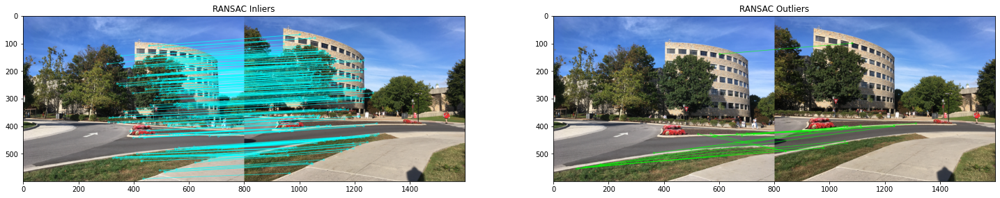

In [ ]:
def test_ransac():
  img1 = cv2.imread('Newman1.png')
  img2 = cv2.imread('Newman3.png')
  pts1, pts2, matches1to2, kp1, kp2 = genSIFTMatchPairs(img1, img2)
  
  inliers_idx, H = RANSAC(pts1, pts2, 500, 50)
  new_matches = []
  for i in range(len(inliers_idx)):
    new_matches.append(matches1to2[inliers_idx[i]])
  allpts = set(range(0,len(pts1)))
  outlier = []
  outlier_idx = list(allpts - set(inliers_idx))
  #print(allpts)

  #print(list(allpts - set(inliers_idx)))
  for i in range(len(outlier_idx)):
    outlier.append(matches1to2[outlier_idx[i]])
  matching_result = cv2.drawMatches(img1, kp1, img2, kp2, new_matches, None, flags=2, 
                                    matchColor = (255, 255, 0), singlePointColor=(0, 0, 255))
###
  not_matching = cv2.drawMatches(img1, kp1, img2, kp2, outlier, None, flags=2, 
                                    matchColor = (0, 255, 0), singlePointColor=(255, 0, 0))
  fig = plt.figure(figsize=(25,20))
  fig.add_subplot(1, 2, 1)
  plt.title('RANSAC Inliers')
  plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))
  fig.add_subplot(1, 2, 2)
  plt.title('RANSAC Outliers')
  plt.imshow(cv2.cvtColor(not_matching, cv2.COLOR_BGR2RGB))
test_ransac()
#test_matches()

#Part (d):  Image stitching.

We are now ready to create a panorama from the three images that were shown at the beginning. The stitch_img() function below receives a Python list of images, which the code stitches together to form one large image.
You must use the functions that you have written to create the panorama. 

We do not expect the result to be perfect, partly because some lens distortion is always present and it will prevent the homography from aligning things perfectly.

In [ ]:

def stitch_img(imgs):
  '''Stitch a list of images together.
   Input:
    imgs: a list of images.
   Output:
    stitched_img: a single stiched image.
    '''


  left_img = np.copy(imgs[1])
  center_img = np.copy(imgs[0])
  right_img = np.copy(imgs[2])

  limg = np.asarray(imgs[1])
  limg = limg.astype("float32")/255.0
  cimg = np.asarray(imgs[0])
  cimg = cimg.astype("float32")/255.0  

  pts0, pts1, matches0to1, kp0, kp1 = genSIFTMatchPairs( np.array(center_img), np.array(left_img))
  _, H = RANSAC(pts0, pts1, 500, 50)
  final = warp_img(cimg, H, [np.shape(left_img)[1], np.shape(left_img)[1]+np.shape(center_img)[1]])
  ko = final

  left_img = np.copy(limg)
  len_y, len_x = left_img.shape[:2]
  stch_img=final
  for i in range(0, len_x):
      for j in range(0, len_y):
          if i<max(np.shape(left_img)[1], np.shape(final)[1]) and j<max(np.shape(left_img)[0], np.shape(final)[0]):
              if(left_img[j,i].all()==0) and (stch_img[j,i].all()==0):
                  stch_img[j,i] = [0, 0, 0]
              else:
                  if(stch_img[j,i].all()==0):
                      stch_img[j,i] = left_img[j,i]
                  else:
                      if (left_img[j,i].all()!=0):
                          stch_img[j, i] = np.copy(left_img[j,i])

        
          
  cv2.imwrite('./f1.png', (stch_img*255).astype(int))
  kk = cv2.imread('f1.png')
  print(np.max(kk))


  left_img = np.copy(imgs[1])
  center_img = np.copy(imgs[0])
  right_img = np.copy(imgs[2])
  rimg = np.asarray(imgs[2])
  rimg = rimg.astype("float32")/255.0  

  final = cv2.imread('./f1.png')
  pts0, pts1, matches0to1, kp0, kp1 = genSIFTMatchPairs( np.array(right_img), final)
  _, H = RANSAC(pts0, pts1, 500, 50)
  final = warp_img(rimg, H, [np.shape(final)[1], np.shape(final)[1]+np.shape(right_img)[1]])



  left_img = cv2.imread('./f1.png')
  left_img = left_img.astype("float32")/255.0
  len_y, len_x = left_img.shape[:2]
  stch_img = final.astype("float32") 

  for i in range(0, len_x):
      for j in range(0, len_y):
          if i<max(np.shape(left_img)[1], np.shape(stch_img)[1]) and j<max(np.shape(left_img)[0], np.shape(stch_img)[0]):
              if(left_img[j,i].all()==0) and (stch_img[j,i].all()==0):
                  stch_img[j,i] = [0, 0, 0]
              else:
                  if(stch_img[j,i].all()==0):
                      stch_img[j,i] = left_img[j,i]
                  else:
                      if (left_img[j,i].all()!=0):
                          stch_img[j, i] = np.copy(left_img[j,i])      
        
  cv2.imwrite('final_stitch.png', (stch_img*255).astype(int))
  raw = cv2.imread('final_stitch.png')


  return raw


244
255
235


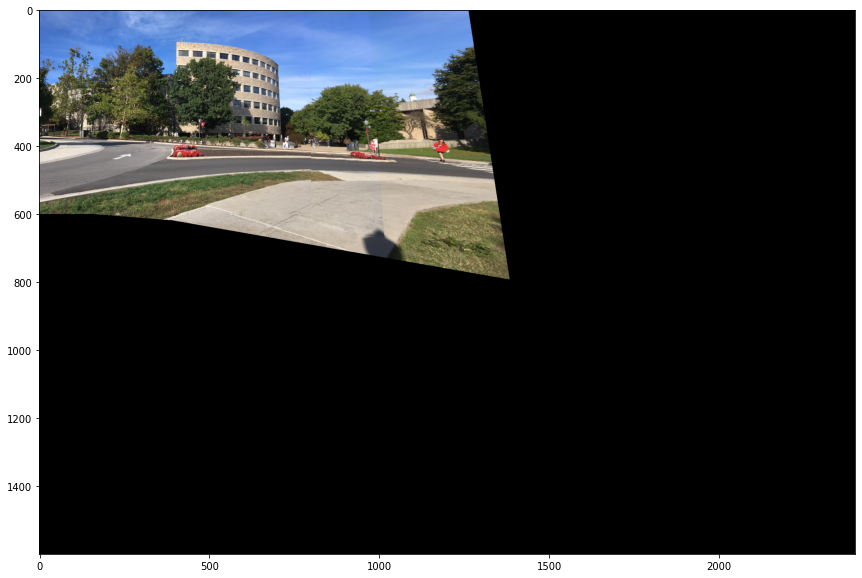

In [ ]:
left_img = cv2.imread("Newman1.png")
center_img = cv2.imread("Newman2.png")
right_img = cv2.imread("Newman3.png")

final_img = stitch_img([center_img, left_img, right_img])

fig = plt.figure()
fig.set_size_inches(25,10) # You can adjust the size of the displayed figure
plt.imshow(cv2.cvtColor(final_img.astype("uint8"), cv2.COLOR_BGR2RGB))




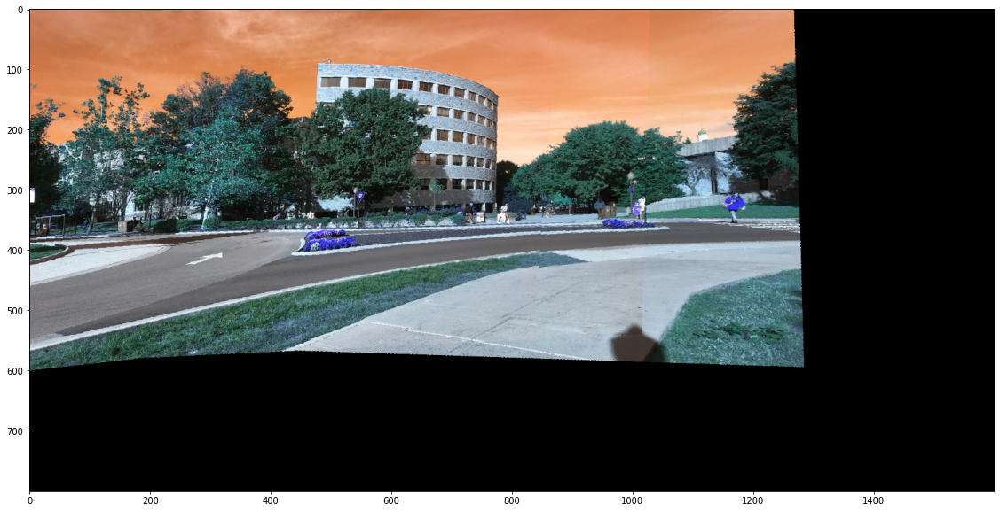

In [ ]:
# additional corrections to the drooping effect

src_img = load_image('final_stitch.png')
normal_img = load_image('final_stitch.png')

# The following are corners of the drooping src image
src_pts = np.matrix('0, 0; 1280, 0; 1380, 800; 0, 600')
# The following are corners of the rectangle we need
normal_img = np.matrix('0,0;1280,0;1280,600;0, 600')

H = compute_homography(src_pts, canvas_pts)
dst_img = warp_img(src_img, H, [canvas_img.shape[0], canvas_img.shape[1]])
cv2.imwrite('final_stitch_newman.png', (dst_img*255).astype(int))
raw = cv2.imread('final_stitch_newman.png')
fig = plt.figure()
fig.set_size_inches(25,10) # You can adjust the size of the displayed figure
plt.imshow(cv2.cvtColor(raw.astype("uint8"), cv2.COLOR_BGR2RGB))


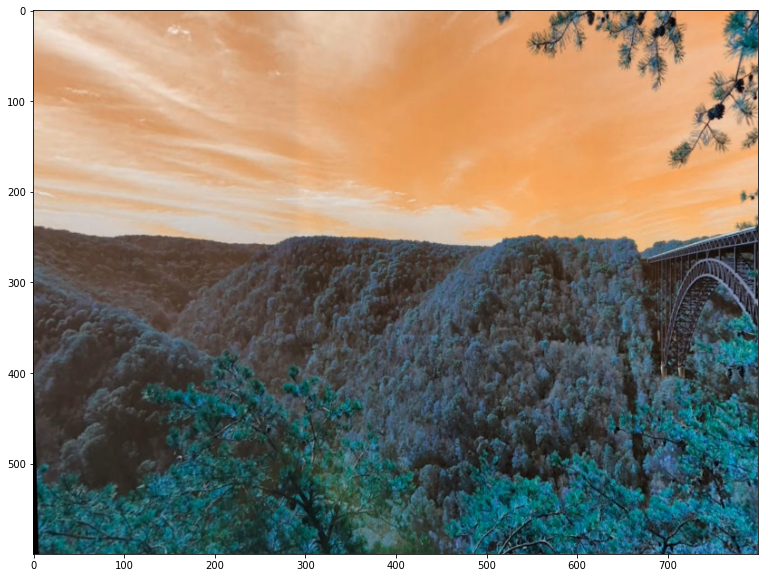

In [ ]:
# Additional images here:

left_img = cv2.resize(cv2.imread("cap1.JPG"), [800,600])
center_img = cv2.resize(cv2.imread("cap2.JPG"), [800,600])
right_img = cv2.resize(cv2.imread("cap3.JPG"), [800,600])

show_image(left_img)

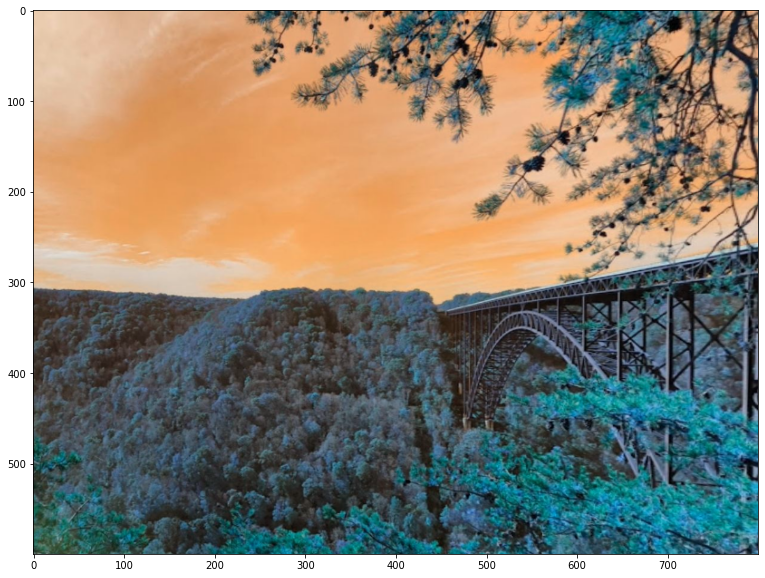

In [ ]:
show_image(center_img)

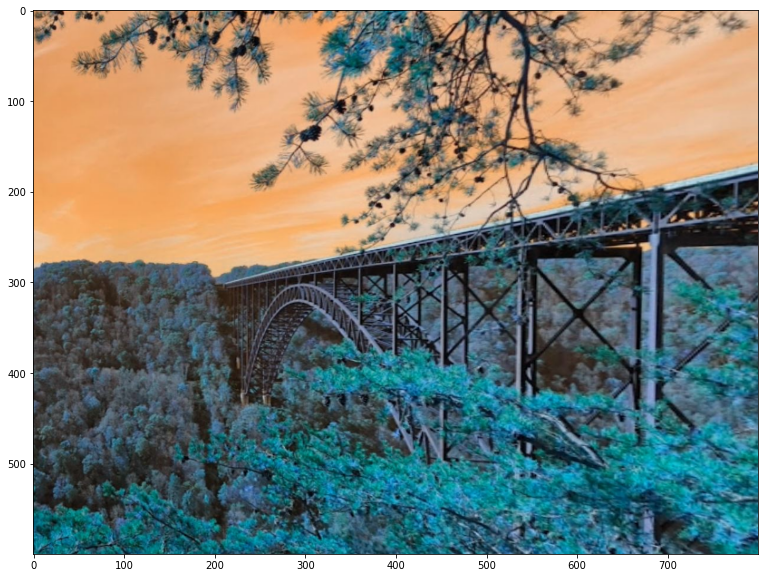

In [ ]:
show_image(right_img)

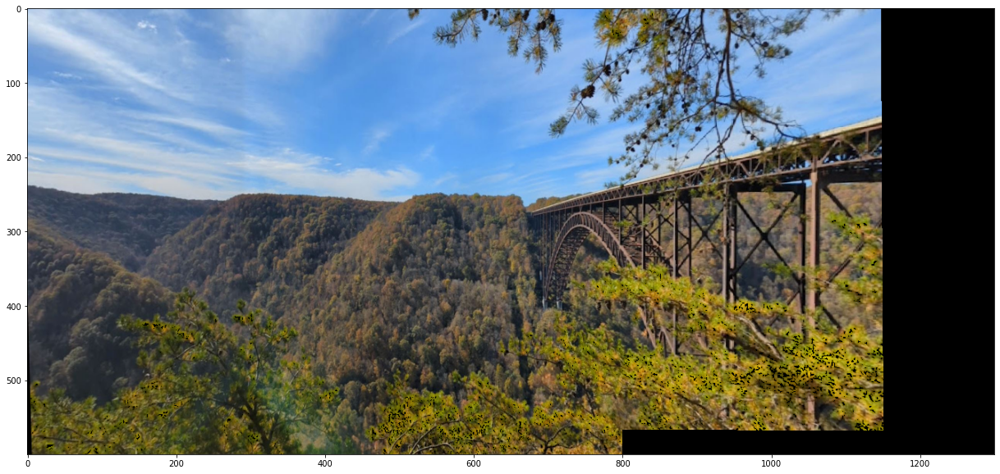

In [ ]:
final_img_personal = stitch_img([center_img, left_img, right_img])

fig = plt.figure()
fig.set_size_inches(25,10) # You can adjust the size of the displayed figure
plt.imshow(cv2.cvtColor(final_img_personal[0:600, 0:1300].astype("uint8"), cv2.COLOR_BGR2RGB))

#SIFT v/s ORB



*   Compare Fundamental Attributes
    1.   Compare Keypoint Detection Results.
    2.   Compare Performance on Matching
    3.   Time Complexity
    4.   Final Remarks 


# 1.) Compare Keypoint Detection Results.

SIFT Keypoints detected =  186
ORB Keypoints detected =  264


Text(0.5, 1.0, 'ORB')

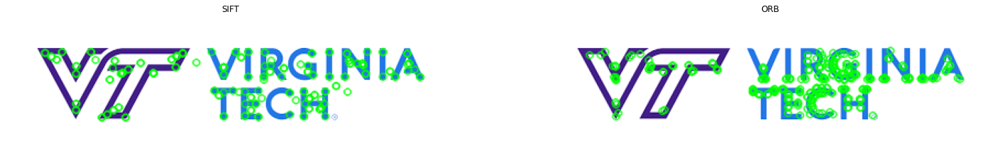

In [ ]:
#  1.) Comparing Keypoint Detection Results.


def testSIFT(img1):
  sift = cv2.SIFT_create()
  kp = sift.detect(img1, None)
  print('SIFT Keypoints detected = ', len(kp))
  img1=cv2.drawKeypoints(img1, kp, None, color=(0, 255, 0))
  return img1


def testORB(img1):
  orb = cv2.ORB_create()
  kp = orb.detect(img1, None)
  print('ORB Keypoints detected = ', len(kp))
  img1=cv2.drawKeypoints(img1, kp, None, color=(0, 255, 0))
  return img1

img = cv2.imread('VT.png')
sift_img = testSIFT(img)
orb_img = testORB(img)

fig = plt.figure(figsize=(25,20))
fig.add_subplot(1, 2, 1)
  
plt.imshow(sift_img)
plt.axis('off')
plt.title("SIFT")

fig.add_subplot(1, 2, 2)
plt.imshow(orb_img)
plt.axis('off')
plt.title("ORB")


SIFT Keypoints detected =  192
ORB Keypoints detected =  264


Text(0.5, 1.0, 'ORB')

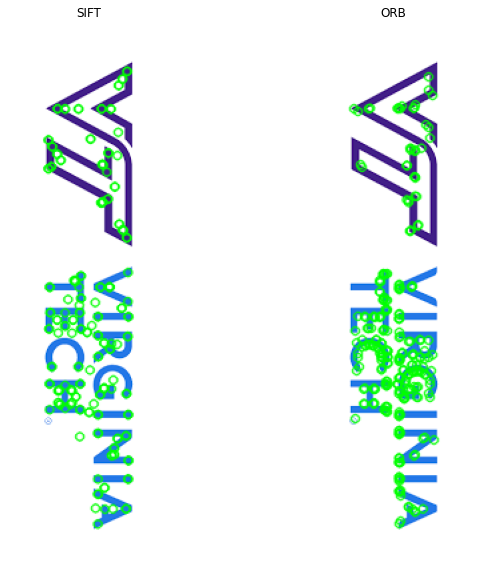

In [ ]:
sift_img = testSIFT(cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE))
orb_img = testORB(cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE))

fig = plt.figure(figsize=(10,10))
fig.add_subplot(1, 2, 1)
  
plt.imshow(sift_img)
plt.axis('off')
plt.title("SIFT")

fig.add_subplot(1, 2, 2)
plt.imshow(orb_img)
plt.axis('off')
plt.title("ORB")

*   As an initial observation, we can clearly see that the **SIFT Keypoints have high variance** and are spread accross the image. Additionally, SIFT has an unstable number of keypoints and is **not 100% rotation immune at 90° angle**, this can be seen in the number of keypoints produced for the same image but rotated. Finally, **there are outliers present in case of SIFT** which can be seen under the letter 'N'. 

*   On the other hand the **ORB detected Keypoints form tightly bound clusters** of overlapping point. Additionally, **ORB produced 90° rotation immune results** for the same image having the same number of keypoints for both the cases. Finally, **ORB doesn't have random outliers for this case**, it correctly detects the trademark sign besides the letter 'H'.

*   A final interesting observation is the **way in which the keypoints are placed**. In the case of **ORB** we have there points placed at certain areas where either **corners are present or a curve is present**.On the other hand **SIFT** does not consider **curves as an area of interest**.

# 2.) Compare Performance on Matching

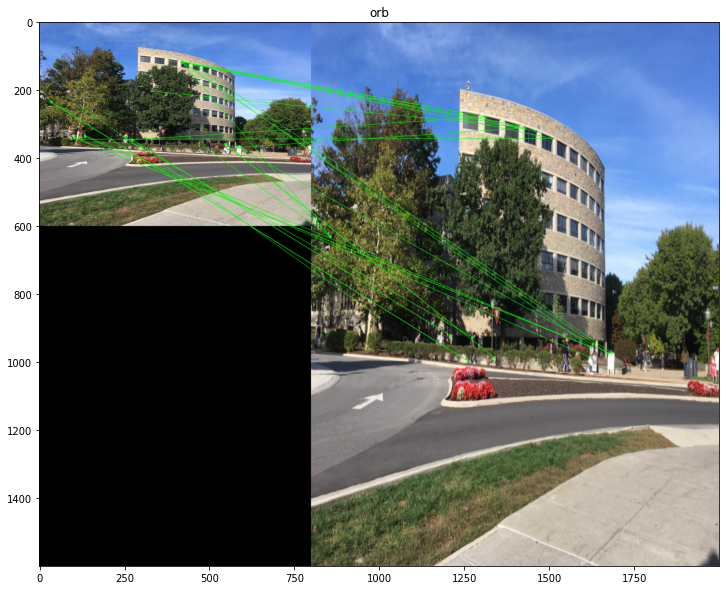

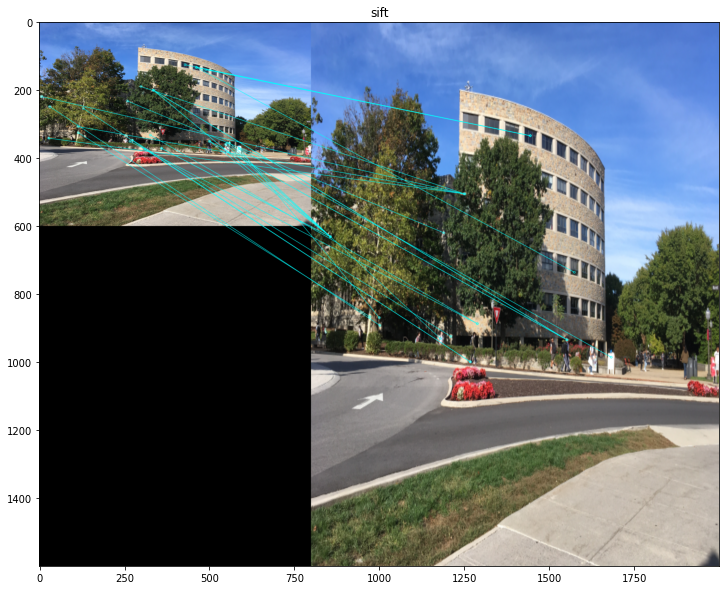

In [ ]:
def genMatchPairs(img1, img2, opt):
  if opt == 'sift':
    det = cv2.SIFT_create(nfeatures=30)
  elif opt == 'orb':
    det = cv2.ORB_create(nfeatures=30)
  kp1, des1 = det.detectAndCompute(img1, None)
  kp2, des2 = det.detectAndCompute(img2, None)
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
  matches = bf.match(des1, des2)
  matches = sorted(matches, key = lambda x:x.distance)

  pts1 = np.zeros((len(matches), 2))
  pts2 = np.zeros((len(matches), 2))
  for i in range(len(matches)):
    pts1[i,:] = kp1[matches[i].queryIdx].pt
    pts2[i,:] = kp2[matches[i].trainIdx].pt

  return pts1, pts2, matches, kp1, kp2

def test_matches(img_name1, img_name2, opt):
  img1 = img_name1
  img2 = img_name2 
  pts1, pts2, matches1to2, kp1, kp2 = genMatchPairs(img1, img2, opt)
  # In the following, parameter flags=2 will remove unmatched points from the display
  if opt == 'sift':
    matching_result = cv2.drawMatches(img1, kp1, img2, kp2, matches1to2, None, flags=2,
      matchColor = (255, 255, 0), singlePointColor=(0, 0, 255))
  elif opt == 'orb':
    matching_result = cv2.drawMatches(img1, kp1, img2, kp2, matches1to2, None, flags=2,
      matchColor = (0, 255, 0), singlePointColor=(0, 255, 255))


  fig = plt.figure()
  plt.title(opt)
  fig.set_size_inches(18,10) # You can adjust the size of the displayed figure
  plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

img1 = cv2.imread('Newman2.png')
img2 = cv2.resize(img1, (2*np.shape(img1)[0], 2*np.shape(img1)[1]))

test_matches(img1, img2 , 'orb')
test_matches(img1, img2 , 'sift')




*   In the above case we can clearly see that **ORB** kind of places all of it's eggs in one basket, that is, the complete cluster of keypoint matches of the top floor has completely failed for ORB. It seems its **not Scale invariant**.

*   On the other hand the variety of keypoints has made **SIFT** a bit more accurate as we can see that only a few matches are not incorrectly mapped but overall a good performance.



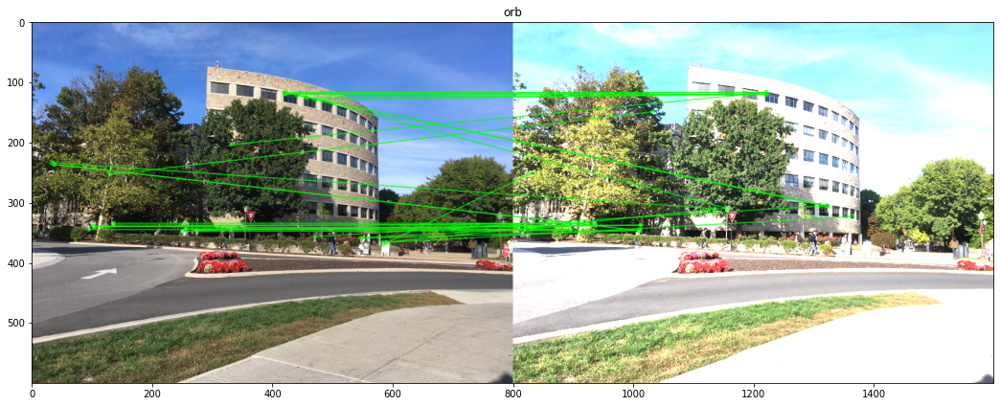

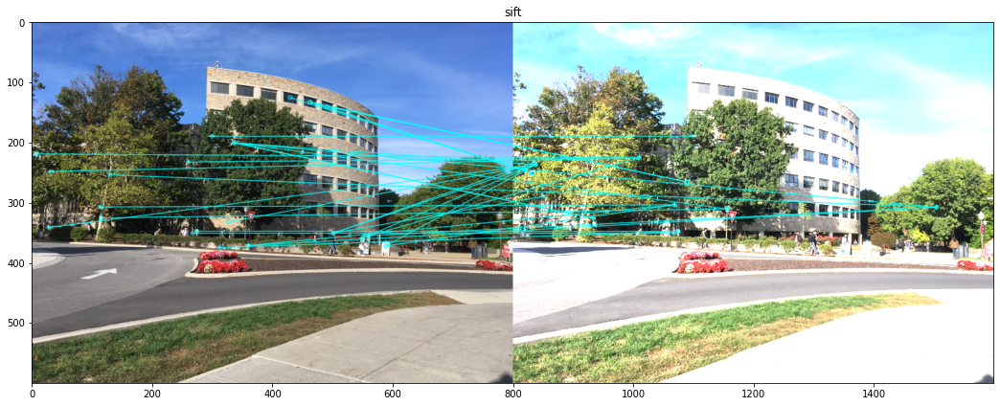

In [ ]:
def intensity_chng(img, chng):
  ret = cv2.add(img, img)
  return ret


img1 = cv2.imread('Newman2.png')
img2 = intensity_chng(img1, 10) 

test_matches(img1, img2 , 'orb')
test_matches(img1, img2 , 'sift')

*   **Sift** seems to perform very **poorly when intensity is scaled up**, there are hardly any correct matches. 

*   **ORB** suffers loss of accuracy as well but is much better for this case.


# 3.) Compare Time Complexity.

In [ ]:
import time

img1 = cv2.imread('Newman2.png')
sift = cv2.SIFT_create()
orb = cv2.ORB_create()


start_sift = time.time()
kp = sift.detect(img1, None)
stop_sift = time.time()

print('SIFT time was: ', (stop_sift - start_sift))


start_orb = time.time()
kp = orb.detect(img1, None)
stop_orb = time.time()

print('ORB time was: ', stop_orb - start_orb)

print('ORB is ', int((stop_sift - start_sift)/(stop_orb - start_orb)), 'times faster than SIFT for our case')

SIFT time was:  0.15601849555969238
ORB time was:  0.015329599380493164
ORB is  10 times faster than SIFT for our case




*   The above shows that **ORB is about 10 times faster than SIFT** for our case.
*   ORB has speed advantage over SIFT.


# 4.) Final Remarks

After the tests performed above, we can conclude a few things as follows:



*   ORB performs better than SIFT at 90° rotations, accuracy-wise.
*   SIFT performs better than ORB in other case of Scale changes.
*   ORB performed better when intensity was scaled up.
*   ORB is about 10 times faster than SIFT for our example.
*   ORB detects curved contours as keypoints while SIFT doesn't for same number of points.

